# **RNN for Abstract classifications**

## AUThOR: Vanessa Verrina



---



# **Introduction**
The aim of this work is to build and implement a Long Short-Term Memory (LSTM) type recurrent neural network (RNN) for text classification.

Applying an LSTM neural network to a text classification problem offers the ability to handle long-term dependencies, store relevant information, handle text sequences, and achieve better performance than other traditional neural architectures.





---



# **Dataset**

**Data Source**: [Kaggle](https://www.kaggle.com/datasets/bonhart/pubmed-abstracts).

**Description**

The dataset contains a large collection of abstracts of scientific articles present in [PubMed](https://pubmed.ncbi.nlm.nih.gov/), i.e. a database that contains more than 35 million citations and abstracts of biomedical scientific articles (with related links).
The dataset, built using web crawling techniques, was designed specifically for the study of Deep Learning techniques.

**Contents**

The first 8 columns of the dataset contain the abstracts divided by category, while in each row there are the relevant abstracts. The last 8 columns contain links to the corresponding scientific articles.

The selected topics are the following:


1.   Deep Learning;
2.   Covid-19;
3.   Human Connectome;
4.   Virtual Reality;
5.   Brain-Machine Interfaces:
6.   Electroactive Polymers;
7.   PEDOT electrodes;
8.   Neuroprosthetics.

Considering that the categories "Electroactive Polymers", "PEDOT electrodes" and "Neuroprosthetics" are poorly represented within the dataset and semantically similar to the "Brain-Machine Interfaces" category, I decided to merge them with the latter.

**Dataset Tipe**: CSV file.



---



# **Libreries**

In [ ]:
import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import seaborn as sn
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import precision_recall_curve
from keras.utils import to_categorical
from keras.utils.vis_utils import plot_model
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Embedding, Bidirectional, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import regularizers
from wordcloud import WordCloud
from PIL import Image
import zipfile
import io
import requests
import tensorboard

# Loads the tensordboard support
%load_ext tensorboard

# Clear any logs from previous runs
!rm -rf ./logs/


nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True



---



# **Dataset Upload**

In [ ]:
# URL del file ZIP su GitHub
url_zip = 'https://github.com/GianlucaLicciardi/Progetto-Deep-Learining/raw/main/pubmed_abstracts.zip'

# Effettua la richiesta per il file ZIP
response = requests.get(url_zip)
zip_file = zipfile.ZipFile(io.BytesIO(response.content))
nome_file_csv = 'pubmed_abstracts.csv'

# Seleziona le colonne
colonne = list(range(1, 9))

# Leggi il file CSV all'interno del file ZIP direttamente in un DataFrame
with zip_file.open(nome_file_csv) as file_csv:
  df = pd.read_csv(file_csv, usecols=colonne)


df.head()


,deep_learning,covid_19,human_connectome,virtual_reality,brain_machine_interfaces,electroactive_polymers,pedot_electrodes,neuroprosthetics
0,(['Magnetic resonance spectroscopic imaging (M...,(['As cancer researchers shutter their labs to...,"(['For decades, it has been largely unknown to...",(['To evaluate the differences between walking...,(['All neural information systems (NIS) rely o...,(['A mediatorless glucose biosensor was develo...,(['In the growing field of brain-machine inter...,(['The heart continuously and cyclically commu...
1,(['Existing deep convolutional neural networks...,"(['In December 2019, the outbreak of pneumonia...",(['While resting-state functional magnetic res...,(['Potentially painful invasive procedures are...,(['Independent component analysis (ICA) as a p...,(['Hierarchical structures of hybrid materials...,(['High-performance transparent and flexible t...,(['This study was aimed at investigating the i...
2,(['Deep learning techniques have been increasi...,"([], 'Treating COVID-19 with Chloroquine.')",(['This paper presents the experimental evalua...,"([""Early exposure to radiological cross-sectio...","([], 'Brain-machine interfaces: assistive, tho...",(['An analytical method was researched for the...,"(['In this investigation, we employed a novel ...",(['Low-intensity focused ultrasound stimulatio...
3,(['The original article unfortunately containe...,"(['18 years ago, in 2002, the world was astoni...","([], ""For Microscopy special issue on 'connect...",(['To investigate the effects of various rehab...,(['While motor-imagery based brain-computer in...,(['The antibacterial properties of a nanocompo...,(['Great progress has been made on the cyclabi...,(['Our brain has developed a specific system t...
4,(['The most common applications of artificial ...,"([], 'Covid-19: Doctors still at ""considerable...",(['A central feature of theories of spatial na...,(['Virtual reality (VR) is a technology that a...,(['The disorders of consciousness refer to cli...,(['The metal-mediated self-assembly of coordin...,(['With the aim of a reliable biosensing exhib...,"([""Electrophysiological techniques have improv..."




---



# **Data Cleaning e Exploratory Data Analysis**

First, let's modify the matrix to have all the abstracts in a single column and the corresponding topic (Topic) in a contiguous column.

In [ ]:
# Trasposizione delle colonne in una colonna con il nome della colonna originale
df = df.melt(var_name='Topic', value_name='Abstracts')

Let's drop the rows in which the Abstract is missing.

In [ ]:
#Eliminazione valori "Na"
df.dropna(subset='Abstracts',inplace=True)

df.shape

(44500, 2)

Let's remove the duplicates.

In [ ]:
#Eliminazione duplicati
duplicati = df.duplicated(subset='Abstracts', keep=False)
df = df[~duplicati]

df.shape

(43426, 2)

Let's visualize the frequency of each topic.

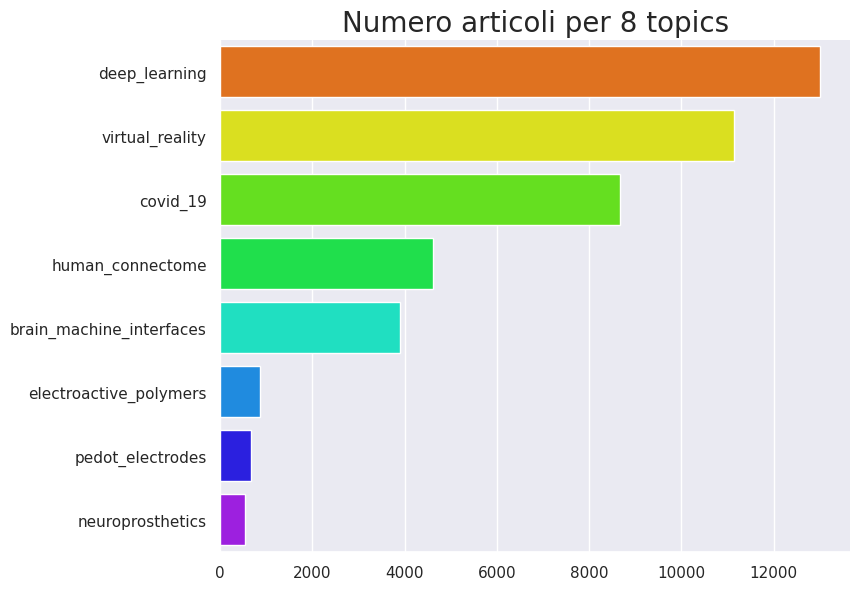

In [ ]:
sn.set_theme(style="white")

counts = sn.set(font_scale = 1)
counts = sn.catplot(y='Topic', data=df, kind="count",
                    order=df['Topic'].value_counts().index,
                    palette='gist_rainbow',height=6, aspect=1.5)
plt.title('Numero articoli per 8 topics',fontsize=20)
counts.set(xlabel=None, ylabel=None)

We therefore have 43426 abstracts divided into 8 categories, according to the topic covered.
From the previous graph, it is possible to observe how the deep learning, virtual reality and COVID-19 classes are the most numerous.

Below we merge the categories "electroactive_polymers", "pedo_electrodes" and "neuroprosthetics" to the category "brain_machine_interfaces" and plot the data again.

In [ ]:
# Lista delle categorie da sostituire
categorie_da_sostituire = ['electroactive_polymers', 'pedot_electrodes', 'neuroprosthetics']
# Sostituisci le categorie desiderate con "brain_machine_interfaces"
df['Topic'].replace(categorie_da_sostituire, 'brain_machine_interfaces', inplace=True)


### Gropu the data in 5 categories


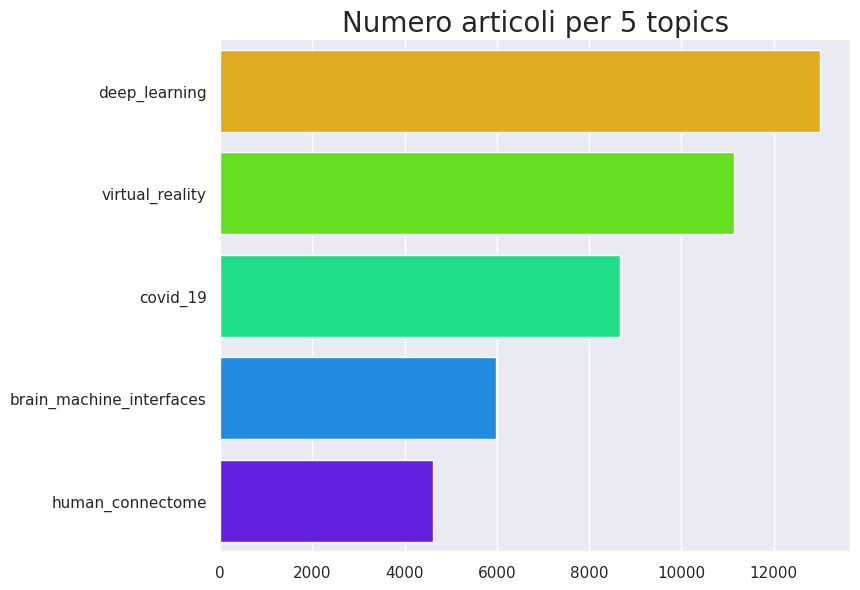

In [ ]:
sn.set_theme(style="white")

counts = sn.set(font_scale = 1)
counts = sn.catplot(y='Topic', data=df, kind="count",
                    order=df['Topic'].value_counts().index,
                    palette='gist_rainbow',height=6, aspect=1.5)
plt.title('Numero articoli per 5 topics',fontsize=20)
counts.set(xlabel=None, ylabel=None)

The 5 categories are slightly unbalanced but I decided to leave them as they are.

In [ ]:
unique, counts = np.unique(df.Topic, return_counts=True)
percents=dict(zip(unique, np.round(counts/len(df)*100,4)))

In [ ]:
for word, definition in percents.items():
    print(word)
    print(f"{definition}%")
    print('-' * 25)

brain_machine_interfaces
13.7752%
-------------------------
covid_19
19.9466%
-------------------------
deep_learning
29.9751%
-------------------------
human_connectome
10.648%
-------------------------
virtual_reality
25.6551%
-------------------------


# **Data Pre-processing**

The pre-processing of textual data is of fundamental importance for the development of good models and helps to better understand the texts.

In this section, we define a text pre-processing function that:
* removes `punctuation`;
* selects only `alphanumeric` terms longer than two letters;
* makes all uppercase letters `lowercase;`
* performs `tokenization` of texts, i.e. dividing an entire text into small units (tokens);
* eliminates `stopwords` (i.e. those words such as articles, auxiliary verbs, etc. that do not give information regarding the context of the text itself);
* carries out `lemmatization`, i.e. the process of reducing an inflected form of a word to its canonical form, called lemma.

`N.B.` This function will be very useful when, once our model has been optimized, we need to test it on abstracts of articles not present in the dataset under examination (new predictions).

In [ ]:
#Funzione pre-processing dei dati
def pre_processing(x):

   # eliminare punteggiatura
   x = re.sub(r'[^\w\s]','',x)

   # tokenization
   x = nltk.word_tokenize(x)
   stop = set(stopwords.words('english')) #set of stopwords
   lemmatizer = WordNetLemmatizer()

   # inizializzazione di una lista
   s = []

   for i in x:

    # eliminazione stopwords
    if i.isalpha() & (len(i)>2) & (i.lower() not in stop):
    #if i.lower() not in stop:

      # lemmatizzazione
      s_lemm = lemmatizer.lemmatize(i.lower())

      s.append(s_lemm)

   return s


In [ ]:
# Applicazione della funzione pre_processing alla colonna Text
df['AbstractsCleaned'] = df['Abstracts'].map(lambda x: pre_processing(x))
df.head()

,Topic,Abstracts,AbstractsCleaned
0,deep_learning,(['Magnetic resonance spectroscopic imaging (M...,"[magnetic, resonance, spectroscopic, imaging, ..."
1,deep_learning,(['Existing deep convolutional neural networks...,"[existing, deep, convolutional, neural, networ..."
2,deep_learning,(['Deep learning techniques have been increasi...,"[deep, learning, technique, increasingly, used..."
3,deep_learning,(['The original article unfortunately containe...,"[original, article, unfortunately, contained, ..."
4,deep_learning,(['The most common applications of artificial ...,"[common, application, artificial, intelligence..."


In [ ]:
df['AbstractsCleaned'] = df['AbstractsCleaned'].str.join(sep=' ')

Let's now use `wordcloud` to visualize the frequency of each word per topic.

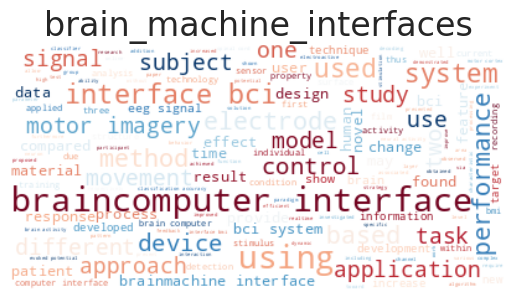

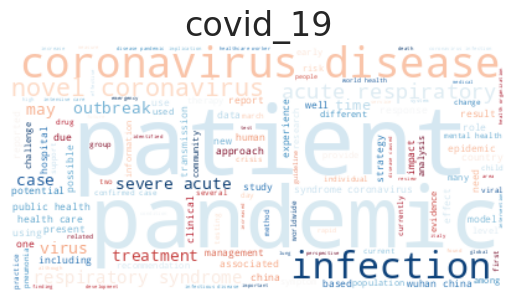

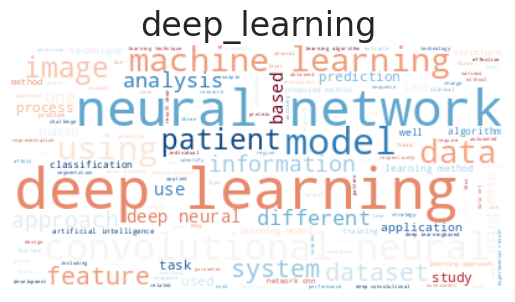

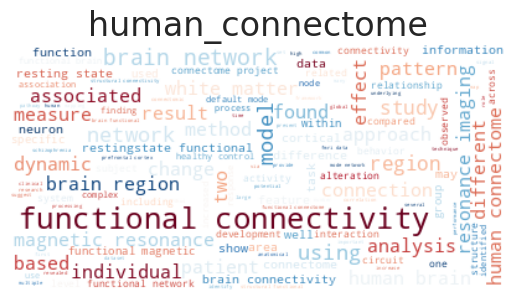

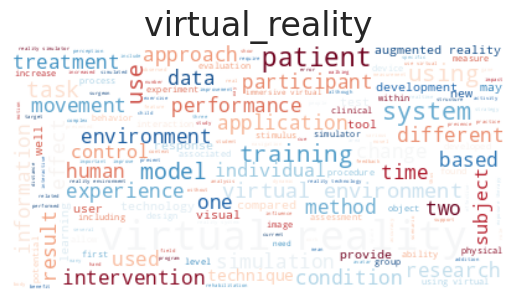

In [ ]:
# group by category
grouped_data = df.groupby('Topic')

# Iterate over each category
for category, group in grouped_data:
    # Concatenate all the text data for the current category
    text = ' '.join(group['AbstractsCleaned'])

    # Generate the word cloud
    wordcloud = WordCloud(max_words=1000,
                           colormap='RdBu',
                           background_color='white',
                           contour_width=.0001,
                           contour_color='teal',
                           #max_font_size=400,
                           #mask=my_mask
                          ).generate(text)

    # Create a figure and axes for the plot
    fig, ax = plt.subplots()

    # Display the word cloud
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(category, fontsize=24)  # Set the category as the title

    # Remove the axis labels
    ax.axis('off')

    #save figure
    #plt.savefig('wordcloud.png')

    # Show plot
    plt.show()

# **Training, Validation & Test sets Split**

* X: Input data ('AbstractsCleaned').

* y: target variable, ()'Topic'). 

At this point, we divide the dataset into training, validation and test sets.
70% of the data, randomly chosen, will be used as a training set, to train for the model. Of these, a further 30% will be used as a validation set to optimize the model parameters.
The remaining 30% of the original dataset will constitute the test set, i.e. the data that we will use to measure the performance of the previously optimized model.

N.B. The data were divided so that in each of the three sets the percentages of each category remained unchanged.

In [ ]:
X = df['AbstractsCleaned']
y = df['Topic']

Factorization of the categorical variable ('Topic').

In [ ]:
y = np.where(y == 'deep_learning',0,
                     np.where(y == 'virtual_reality',1,
                     np.where(y == 'covid_19',2,
                     np.where(y == 'brain_machine_interfaces',3,
                     np.where(y == 'human_connectome',4,5)))))

# Split in trining, validation e test set
X_train_val, X_test, y_train_val, y_test  = train_test_split(X, y, test_size=0.33, random_state=42,stratify = y)

# split the train once again in train and valuation data
X_train, X_val, y_train, y_val  = train_test_split(X_train_val, y_train_val, test_size=0.33, random_state=42,stratify = y_train_val)


In [ ]:
#Distribuzione percentuale delle classi nel training set
unique, counts = np.unique(y_train, return_counts=True)
dict(zip(unique, np.round(counts/len(y_train),4)))

{0: 0.2997, 1: 0.2566, 2: 0.1995, 3: 0.1377, 4: 0.1065}

In [ ]:
#Distribuzione percentuale delle classi nel valuation set
unique, counts = np.unique(y_val, return_counts=True)
dict(zip(unique, np.round(counts/len(y_val),4)))

{0: 0.2997, 1: 0.2565, 2: 0.1995, 3: 0.1378, 4: 0.1064}

In [ ]:
#Distribuzione percentuale delle classi nel test set
unique, counts = np.unique(y_test, return_counts=True)
dict(zip(unique, np.round(counts/len(y_test),4)))

{0: 0.2998, 1: 0.2566, 2: 0.1994, 3: 0.1377, 4: 0.1065}



---



# **One-Hot-Encoding of the target variable**

We use TensorFlow's *to_categorical* function to convert the integer label array into one-hot encoding matrices. This feature is often used when working with classification problems where labels are represented as integer values rather than one-hot vectors.

In [ ]:
#One-hot enconding delle labels
labelencoder_Y_1 = LabelEncoder()

y_test = labelencoder_Y_1.fit_transform(y_test)
y_test = to_categorical(y_test)

y_train = labelencoder_Y_1.fit_transform(y_train)
y_train = to_categorical(y_train)

y_val = labelencoder_Y_1.fit_transform(y_val)
y_val = to_categorical(y_val)

# **Dictionary**

By using "Tokenizer text to sequence" from Keras, I convert the abstracts in numerical sequences to use as input of our NN.

In [ ]:
#Creazione dizionario
vocab_size = 20000
oov_tok = "<UKW>"
tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)

tokenizer.fit_on_texts(X_train)

vocab_size =  len(tokenizer.word_index)


In [ ]:
#Tokenizzazione training, valuation e test set
train_sequences = tokenizer.texts_to_sequences(X_train)
val_sequences = tokenizer.texts_to_sequences(X_val)
test_sequences = tokenizer.texts_to_sequences(X_test)

At this point we need to transform our arrays into tensors that we can use in our network.
Since we work with sentences with a variable number of words, our data has variable size along the first dimension.
In TensorFlow, you can create a ragged tensor, which is a type of data structure that allows you to represent data with variable dimensions along one or more dimensions. Unlike regular tensors, where all dimensions have the same length, ragged tensors can have variable dimensions within the same tensor.


In [ ]:
#Conversione tensori a tratti
X_train_ragged = tf.ragged.constant(train_sequences)
X_val_ragged = tf.ragged.constant(val_sequences)
X_test_ragged = tf.ragged.constant(test_sequences)



---



# **Embedding**

Word embedding is a vector representation of words that allows to map human language into a structured geometric space.

Word embedding will take place within our network and will be given as input to the neural network layers and learned along with the network weights during the training process.

The embedding parameters used are the following:


* Vocabulary size = 20000 (the 20000 most frequent words within our vocabulary).

* Embedding Size = 256.



---



# **Creating different RNN**

A questo punto, iniziamo a costruire il nostro modello seguendo i seguenti step:

1. We define the structure of the network by choosing:

>* number and type of layers (including the embedding layer);
>*numbers of neurons per layer;
>*activation function;
>*regularizers (when present).

>Some of these parameters will be varied in the proposed models.

2. “Compile” step: once the network architecture has been defined, you need to choose:

>* Loss function: `categorical_crossentropy`, used for multiclass classification problems.
>* Optimizer: `Adam`, which combines the concepts of two other optimization methods (AdaGrad and RMSprop).
>* Metric: `AUC(PR Curve)`, to be optimized during the training and validation processes. Having a slightly unbalanced dataset, we believe that the Precision-Recall curve is preferable to the ROC.

3. Fit of the model on the training and validation data. In this step we define:
>* the number of epochs,
>* the batch size,
>* the learning rate.

>Some of these parameters will be varied in the proposed models.



---



# Metric

In order to correctly train the neural network in the presence of a dataset with unbalanced data and a multiclass target variable, I decided to use the Precision Recall AUC as a metric, i.e. the area subtended by the Precision-Recall curve.

In [ ]:
#Precision Recall AUC
PR = tf.keras.metrics.AUC(
    num_thresholds=200,
    curve='PR',
    summation_method='interpolation',
    name=None,
    dtype=None,
    thresholds=None,
    multi_label= True,
    num_labels=5,
    label_weights=None,
    from_logits=False
)



---



# **Model 1**

**Model's Parameters:**


*   Model Type: LSTM
*   Layers: Bidirectional, Bidirectional, Dense, Dense
*   N° units: 128, 64, 32, 5
*   Batch size: 64
*   Epochs: 20

In [ ]:
tf.random.set_seed(42)

model = Sequential()
embedding_dim = 256
model.add(Embedding(input_dim = vocab_size, output_dim = embedding_dim))
model.add(Bidirectional(LSTM(128,return_sequences=True)))
model.add(Bidirectional(LSTM(64)))
model.add(Dense(32, activation='relu'))
model.add(Dense(5, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(), metrics= PR)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 256)         15465984  
                                                                 
 bidirectional (Bidirectiona  (None, None, 256)        394240    
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 128)              164352    
 nal)                                                            
                                                                 
 dense (Dense)               (None, 32)                4128      
                                                                 
 dense_1 (Dense)             (None, 5)                 165       
                                                                 
Total params: 16,028,869
Trainable params: 16,028,869
No

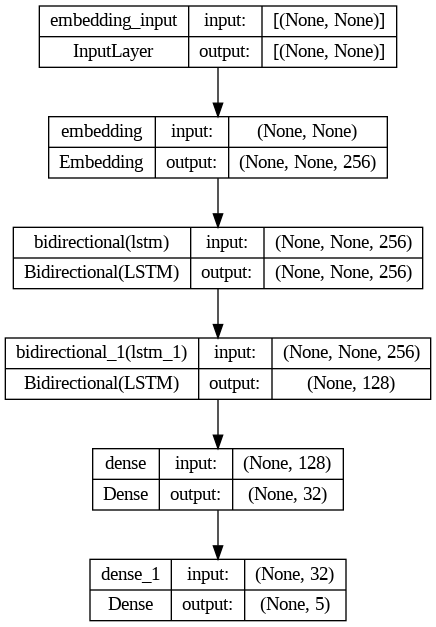

In [ ]:
plot_model(model, show_layer_names=True, show_shapes=True)

In [ ]:
history = model.fit(X_train_ragged, y_train, validation_data=(X_val_ragged, y_val), epochs=20,batch_size=64)

Epoch 1/20
305/305 [==============================] - 92s 251ms/step - loss: 0.4119 - auc: 0.9250 - val_loss: 0.2260 - val_auc: 0.9741
Epoch 2/20
305/305 [==============================] - 48s 156ms/step - loss: 0.1086 - auc: 0.9902 - val_loss: 0.2537 - val_auc: 0.9704
Epoch 3/20
305/305 [==============================] - 38s 124ms/step - loss: 0.0526 - auc: 0.9964 - val_loss: 0.2381 - val_auc: 0.9701
Epoch 4/20
305/305 [==============================] - 33s 109ms/step - loss: 0.0282 - auc: 0.9982 - val_loss: 0.2425 - val_auc: 0.9694
Epoch 5/20
305/305 [==============================] - 30s 98ms/step - loss: 0.0329 - auc: 0.9980 - val_loss: 0.2998 - val_auc: 0.9606
Epoch 6/20
305/305 [==============================] - 28s 93ms/step - loss: 0.0294 - auc: 0.9988 - val_loss: 0.3039 - val_auc: 0.9585
Epoch 7/20
305/305 [==============================] - 29s 96ms/step - loss: 0.0170 - auc: 0.9992 - val_loss: 0.3007 - val_auc: 0.9568
Epoch 8/20
305/305 [==============================] - 26s 

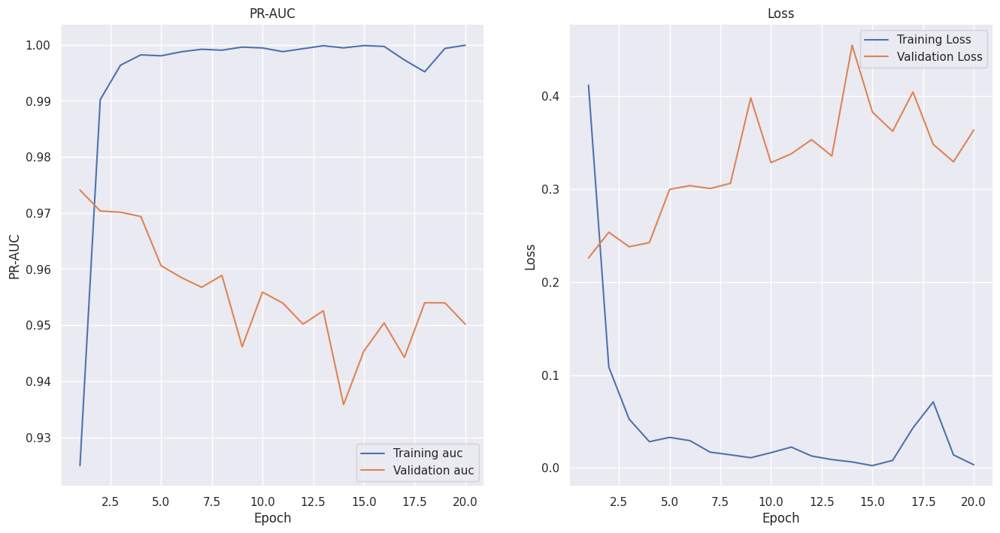

In [ ]:
# Estrai i dati di accuracy e loss dall'oggetto history
xaxis = range(1,21)
auc = history.history['auc']
val_auc = history.history['val_auc']
loss = history.history['loss']
val_loss = history.history['val_loss']

# Creiamo il grafico
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(xaxis, auc, label='Training auc')
plt.plot(xaxis, val_auc, label='Validation auc')
plt.xlabel('Epoch')
plt.ylabel('PR-AUC')
plt.title('PR-AUC')
plt.legend()

# Creiamo il grafico per la loss
plt.subplot(1, 2, 2)
plt.plot(xaxis, loss, label='Training Loss')
plt.plot(xaxis, val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss')
plt.legend()

# Mostra i grafici
plt.show()

**Comment:** From the above graph it can be observed that already from the second epoch the loss reverses its decreasing trend and, therefore, the network reduces its ability to generalize correctly on the validation set (overfitting). Similarly, the Precision-Recall AUC is very high (correctly tends to 1) on the training data while on the validation data it reduces after an initial phase of growth.



---



## **Model 2**

**Model's Parameters:**

*   Model Type: LSTM
*   Layers: Bidirectional, Bidirectional, Dense, Dense
*   N° units: 128, 64, 32, 5
*   Batch size: 64
*   Epochs: 20
*   Learning rate= 0.0001 (reduced to prevent overfitting)
*   L2 regularizer with coeff. = 0.01 in the Bidirectional layers and coeff.=0.001 in the Dense layer.

In [ ]:
tf.random.set_seed(42)

model1 = Sequential()
embedding_dim = 256
model1.add(Embedding(input_dim = vocab_size, output_dim = embedding_dim))
model1.add(Bidirectional(LSTM(128,return_sequences=True, kernel_regularizer= regularizers.l2(0.01))))
model1.add(Bidirectional(LSTM(64, kernel_regularizer=regularizers.l2(0.01))))
model1.add(Dense(32, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model1.add(Dense(5, activation='softmax'))

model1.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001), metrics=PR)

In [ ]:
model1.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, None, 256)         15465984  
                                                                 
 bidirectional_10 (Bidirecti  (None, None, 256)        394240    
 onal)                                                           
                                                                 
 bidirectional_11 (Bidirecti  (None, 128)              164352    
 onal)                                                           
                                                                 
 dense_10 (Dense)            (None, 32)                4128      
                                                                 
 dense_11 (Dense)            (None, 5)                 165       
                                                                 
Total params: 16,028,869
Trainable params: 16,028,869


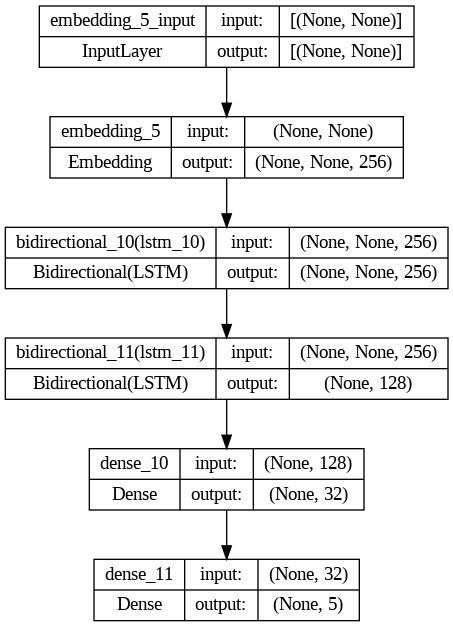

In [ ]:
plot_model(model1, show_layer_names=True, show_shapes=True)

In [ ]:
history1 = model1.fit(X_train_ragged, y_train, validation_data=(X_val_ragged, y_val), epochs=20,batch_size=64)

Epoch 1/20
305/305 [==============================] - 35s 88ms/step - loss: 8.9253 - auc: 0.7471 - val_loss: 5.4072 - val_auc: 0.8135
Epoch 2/20
305/305 [==============================] - 25s 83ms/step - loss: 3.6389 - auc: 0.8999 - val_loss: 2.4193 - val_auc: 0.9333
Epoch 3/20
305/305 [==============================] - 25s 83ms/step - loss: 1.6857 - auc: 0.9586 - val_loss: 1.2910 - val_auc: 0.9452
Epoch 4/20
305/305 [==============================] - 25s 83ms/step - loss: 0.9388 - auc: 0.9700 - val_loss: 0.8757 - val_auc: 0.9442
Epoch 5/20
305/305 [==============================] - 25s 82ms/step - loss: 0.7215 - auc: 0.9722 - val_loss: 0.7344 - val_auc: 0.9560
Epoch 6/20
305/305 [==============================] - 26s 84ms/step - loss: 0.5559 - auc: 0.9847 - val_loss: 0.6614 - val_auc: 0.9577
Epoch 7/20
305/305 [==============================] - 26s 86ms/step - loss: 0.5105 - auc: 0.9841 - val_loss: 0.5985 - val_auc: 0.9618
Epoch 8/20
305/305 [==============================] - 27s 87ms

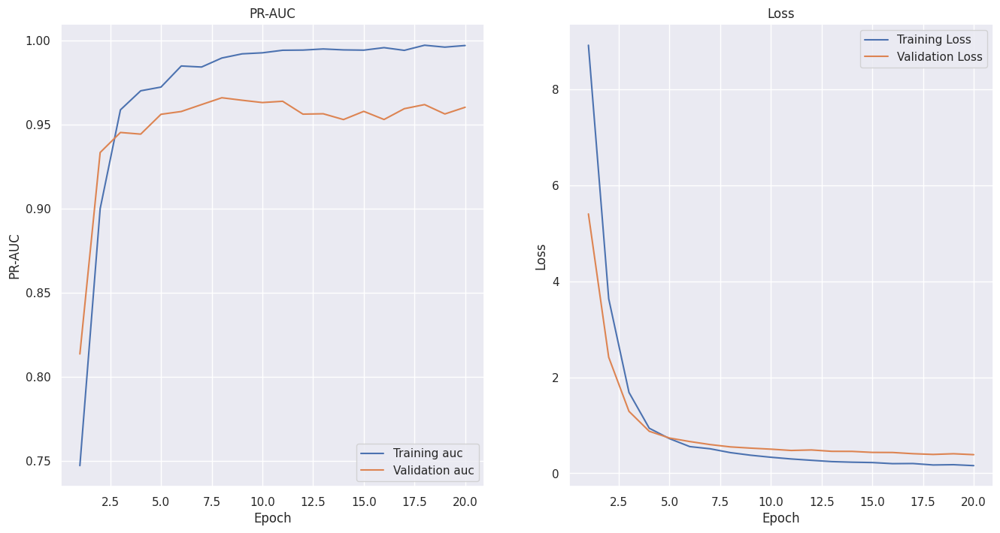

In [ ]:
# Estrai i dati di accuracy e loss dall'oggetto history
xaxis = range(1,21)
auc = history1.history['auc']
val_auc = history1.history['val_auc']
loss = history1.history['loss']
val_loss = history1.history['val_loss']

# Creiamo il grafico
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(xaxis, auc, label='Training auc')
plt.plot(xaxis, val_auc, label='Validation auc')
plt.xlabel('Epoch')
plt.ylabel('PR-AUC')
plt.title('PR-AUC')
plt.legend()

# Creiamo il grafico per la loss
plt.subplot(1, 2, 2)
plt.plot(xaxis, loss, label='Training Loss')
plt.plot(xaxis, val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss')
plt.legend()

# Mostra i grafici
plt.show()

**Comment:** By modifying model 1 by inserting L2 regularization and reducing the learning rate it is possible to observe a significant improvement in the network performance. With reference to the loss function, learning occurs gradually up to the 10th epoch after which it tends to stabilize, similarly the Precision-Recall AUC grows until it stabilizes around approximately 0.96.

---

## **Model 3**

**Model's Parameters:**

*   Model Type: LSTM
*   Layers: Bidirectional, Bidirectional, Dense, Dense
*   N° units: 512, 256, 64, 5
*   Batch size: 64
*   Epochs: 20


I incresed the number of units per layer in order to improve the model's performances. To avoid overfitting, a dropout layer (0.5) was added in the Dense layer.

In [ ]:
from keras.backend import dropout
tf.random.set_seed(42)

model2 = Sequential()
embedding_dim = 256
model2.add(Embedding(input_dim = vocab_size, output_dim = embedding_dim))
model2.add(Bidirectional(LSTM(512,return_sequences=True, kernel_regularizer= regularizers.l2(0.01))))
model2.add(Bidirectional(LSTM(256, kernel_regularizer=regularizers.l2(0.01))))
model2.add(Dense(64, kernel_regularizer=regularizers.l2(0.01), activation='relu'))
model2.add(Dropout(0,5))
model2.add(Dense(5, activation='softmax'))
model2.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001), metrics=PR)

In [ ]:
history2 = model2.fit(X_train_ragged, y_train, validation_data=(X_val_ragged, y_val), epochs=20, batch_size=64)

Epoch 1/20
305/305 [==============================] - 68s 198ms/step - loss: 15.7317 - auc: 0.7489 - val_loss: 6.3718 - val_auc: 0.6568
Epoch 2/20
305/305 [==============================] - 68s 223ms/step - loss: 3.3643 - auc: 0.7171 - val_loss: 1.9216 - val_auc: 0.7220
Epoch 3/20
305/305 [==============================] - 58s 191ms/step - loss: 1.3002 - auc: 0.7758 - val_loss: 1.1054 - val_auc: 0.7795
Epoch 4/20
305/305 [==============================] - 59s 193ms/step - loss: 0.8294 - auc: 0.8892 - val_loss: 0.8766 - val_auc: 0.8724
Epoch 5/20
305/305 [==============================] - 59s 192ms/step - loss: 0.6314 - auc: 0.9367 - val_loss: 0.8083 - val_auc: 0.8616
Epoch 6/20
305/305 [==============================] - 68s 224ms/step - loss: 0.4736 - auc: 0.9697 - val_loss: 0.7061 - val_auc: 0.9002
Epoch 7/20
305/305 [==============================] - 61s 198ms/step - loss: 0.4064 - auc: 0.9733 - val_loss: 0.6804 - val_auc: 0.8896
Epoch 8/20
305/305 [==============================] - 

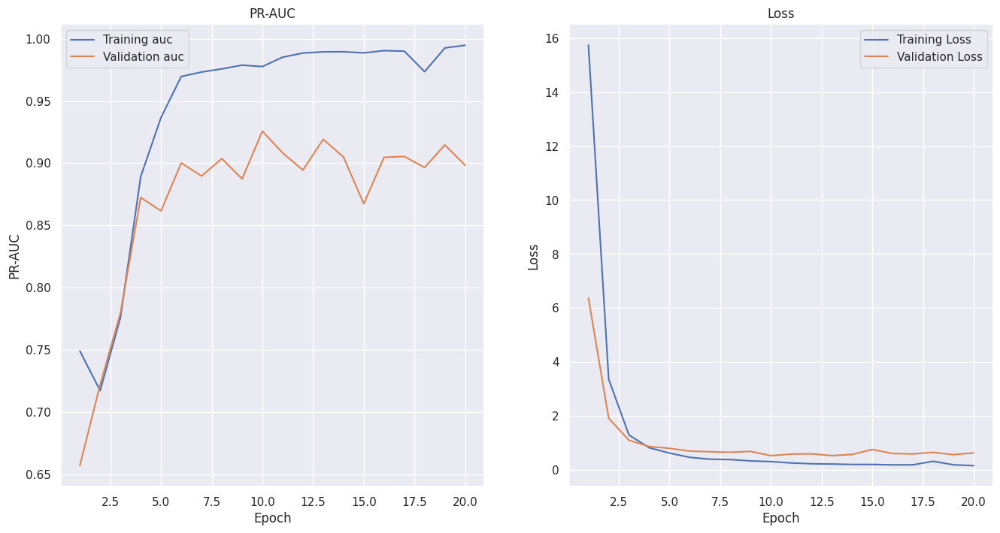

In [ ]:
# Estrai i dati di accuracy e loss dall'oggetto history
xaxis = range(1,21)
auc = history2.history['auc']
val_auc = history2.history['val_auc']
loss = history2.history['loss']
val_loss = history2.history['val_loss']

# Creiamo il grafico
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(xaxis, auc, label='Training auc')
plt.plot(xaxis, val_auc, label='Validation auc')
plt.xlabel('Epoch')
plt.ylabel('PR-AUC')
plt.title('PR-AUC')
plt.legend()

# Creiamo il grafico per la loss
plt.subplot(1, 2, 2)
plt.plot(xaxis, loss, label='Training Loss')
plt.plot(xaxis, val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss')
plt.legend()

# Mostra i grafici
plt.show()

**Comment:** By modifying Model 2, i.e. increasing the complexity of the network by increasing the number of units within the layers, its performance does not improve. The PR-AUC value for the validation set drops below 0.90 and the curves are less smooth.



---



# **Graphical Recap**




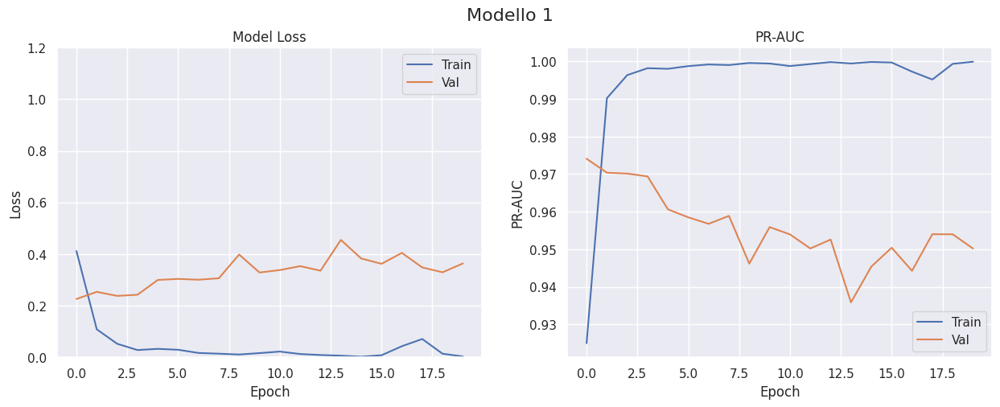

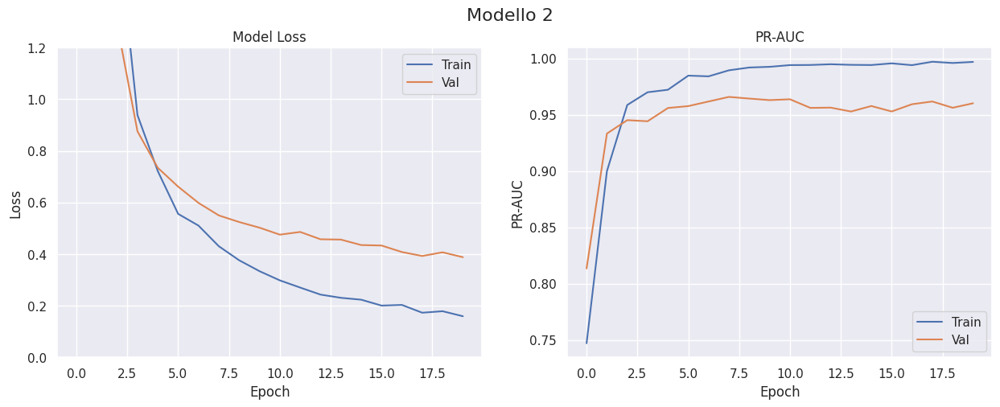

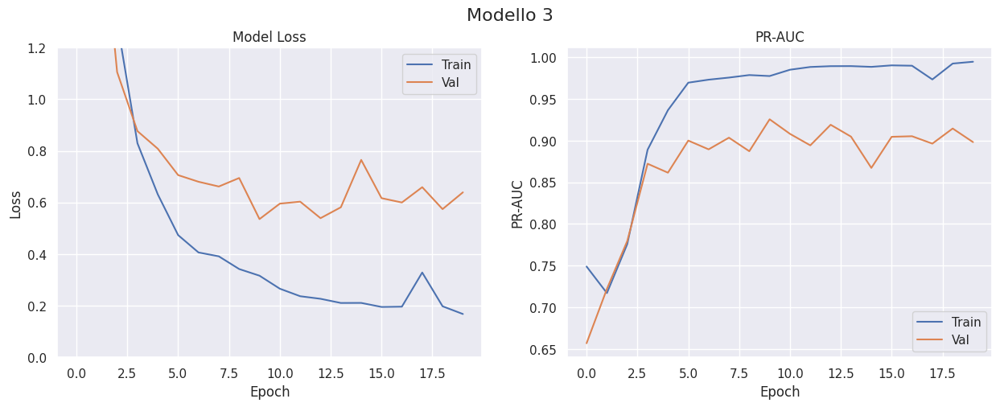

In [ ]:
for h,tit in zip([history,history1,history2],['Modello 1','Modello 2','Modello 3']):
  fig, ax = plt.subplots(1,2, figsize=(15,5))
  fig.suptitle(tit, fontsize=16)
  ax[0].plot(h.history['loss'])
  ax[0].plot(h.history['val_loss'])
  ax[0].set_title('Model Loss')
  ax[0].set_ylabel('Loss')
  ax[0].set_xlabel('Epoch')
  ax[0].legend(['Train', 'Val'], loc='upper right')
  ax[0].set_ylim(top=1.2, bottom=0)

  ax[1].plot(h.history['auc'])
  ax[1].plot(h.history['val_auc'])
  ax[1].set_title('PR-AUC')
  ax[1].set_ylabel('PR-AUC')
  ax[1].set_xlabel('Epoch')
  ax[1].legend(['Train', 'Val'], loc='lower right')

  fig.show()



---



# **Best Model**

 The best model is `MODELLO 2`.

I now reduce the epochs from 20 to 10.

In [ ]:
tf.random.set_seed(42)

model2 = Sequential()
embedding_dim = 256
model2.add(Embedding(input_dim = vocab_size, output_dim = embedding_dim))
model2.add(Bidirectional(LSTM(128,return_sequences=True, kernel_regularizer= regularizers.l2(0.01))))
model2.add(Bidirectional(LSTM(64, kernel_regularizer=regularizers.l2(0.01))))
model2.add(Dense(32, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model2.add(Dense(5, activation='softmax'))

model2.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001), metrics = PR)


In [ ]:
model2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, None, 256)         15465984  
                                                                 
 bidirectional_4 (Bidirectio  (None, None, 1024)       3149824   
 nal)                                                            
                                                                 
 bidirectional_5 (Bidirectio  (None, 512)              2623488   
 nal)                                                            
                                                                 
 dense_4 (Dense)             (None, 64)                32832     
                                                                 
 dense_5 (Dense)             (None, 5)                 325       
                                                                 
Total params: 21,272,453
Trainable params: 21,272,453


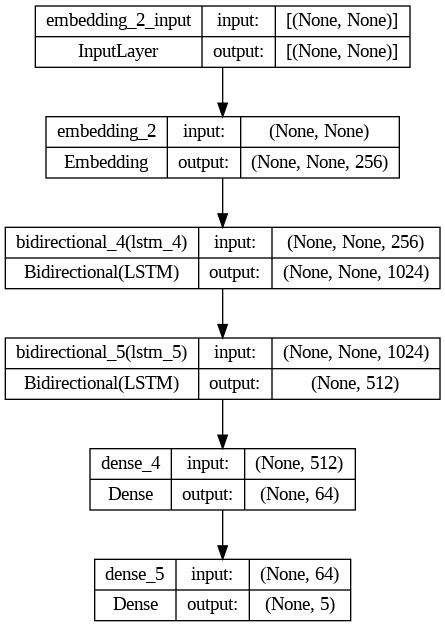

In [ ]:
plot_model(model2, show_layer_names=True, show_shapes=True)

In [ ]:
import tensorflow as tf
call = [
# Write TensorBoard logs to './logs' directory
tf.keras.callbacks.TensorBoard(log_dir='./logs')
]

In [ ]:
history2 = model2.fit(X_train_ragged, y_train, validation_data=(X_val_ragged, y_val), epochs=10, batch_size=64, callbacks=call)

Epoch 1/10
305/305 [==============================] - 43s 111ms/step - loss: 8.8928 - auc: 0.7122 - val_loss: 5.3027 - val_auc: 0.8240
Epoch 2/10
305/305 [==============================] - 29s 93ms/step - loss: 3.6450 - auc: 0.8263 - val_loss: 2.5845 - val_auc: 0.8892
Epoch 3/10
305/305 [==============================] - 27s 89ms/step - loss: 1.7717 - auc: 0.9573 - val_loss: 1.3953 - val_auc: 0.9557
Epoch 4/10
305/305 [==============================] - 29s 93ms/step - loss: 1.0487 - auc: 0.9764 - val_loss: 1.0007 - val_auc: 0.9504
Epoch 5/10
305/305 [==============================] - 29s 95ms/step - loss: 0.7646 - auc: 0.9806 - val_loss: 0.8163 - val_auc: 0.9575
Epoch 6/10
305/305 [==============================] - 31s 100ms/step - loss: 0.6060 - auc: 0.9879 - val_loss: 0.7172 - val_auc: 0.9606
Epoch 7/10
305/305 [==============================] - 27s 89ms/step - loss: 0.5102 - auc: 0.9907 - val_loss: 0.6505 - val_auc: 0.9600
Epoch 8/10
305/305 [==============================] - 31s 10

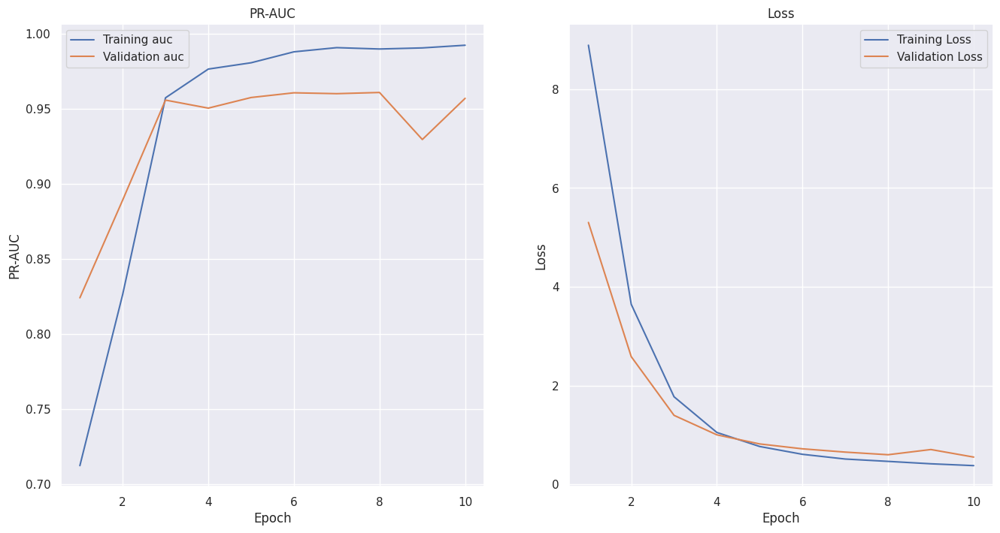

In [ ]:
# Estrai i dati di PrecisionRecall e loss dall'oggetto history
xaxis = range(1,11)
accuracy = history2.history['auc']
val_accuracy = history2.history['val_auc']
loss = history2.history['loss']
val_loss = history2.history['val_loss']

# Crea il grafico per l'accuracy
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(xaxis, accuracy, label='Training auc')
plt.plot(xaxis, val_accuracy, label='Validation auc')
plt.xlabel('Epoch')
plt.ylabel('PR-AUC')
plt.title('PR-AUC')
plt.legend()

# Crea il grafico per la loss
plt.subplot(1, 2, 2)
plt.plot(xaxis, loss, label='Training Loss')
plt.plot(xaxis, val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss')
plt.legend()

# Mostra i grafici
plt.show()



---



# **Tensorboard - Best Model**

In [ ]:
#chrome://settings/2. Under Privacy and security >> Cookies and other site data >> Allow all cookies
%tensorboard --logdir "./logs"

from tensorboard import notebook
notebook.display()

<IPython.core.display.Javascript object>

Selecting TensorBoard with logdir ./logs (started 0:00:00 ago; port 6006, pid 18428).


<IPython.core.display.Javascript object>



---



# **Best Model - traing on the whole train set**



In [ ]:
#Conversione tensori a tratti
train_val_sequence = tokenizer.texts_to_sequences(X_train_val)
X_train_val_ragged = tf.ragged.constant(train_val_sequence)
#One-hot enconding
y_train_val = labelencoder_Y_1.fit_transform(y_train_val)
y_train_val = to_categorical(y_train_val)

In [ ]:
tf.random.set_seed(42)

modelfinal = Sequential()
embedding_dim = 256
modelfinal.add(Embedding(input_dim = vocab_size, output_dim = embedding_dim))
modelfinal.add(Bidirectional(LSTM(128,return_sequences=True, kernel_regularizer= regularizers.l2(0.01))))
modelfinal.add(Bidirectional(LSTM(64, kernel_regularizer=regularizers.l2(0.01))))
modelfinal.add(Dense(32, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
modelfinal.add(Dense(5, activation='softmax'))

modelfinal.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001), metrics = PR)


In [ ]:
historyfinal = modelfinal.fit(X_train_val_ragged, y_train_val, epochs=10, batch_size=64)

Epoch 1/10
455/455 [==============================] - 40s 72ms/step - loss: 7.4993 - auc: 0.7885
Epoch 2/10
455/455 [==============================] - 35s 76ms/step - loss: 2.6339 - auc: 0.9201
Epoch 3/10
455/455 [==============================] - 33s 72ms/step - loss: 1.4186 - auc: 0.9591
Epoch 4/10
455/455 [==============================] - 35s 78ms/step - loss: 0.9575 - auc: 0.9802
Epoch 5/10
455/455 [==============================] - 37s 81ms/step - loss: 0.7398 - auc: 0.9839
Epoch 6/10
455/455 [==============================] - 33s 72ms/step - loss: 0.5663 - auc: 0.9904
Epoch 7/10
455/455 [==============================] - 35s 77ms/step - loss: 0.4498 - auc: 0.9922
Epoch 8/10
455/455 [==============================] - 33s 73ms/step - loss: 0.3887 - auc: 0.9908
Epoch 9/10
455/455 [==============================] - 36s 78ms/step - loss: 0.3059 - auc: 0.9945
Epoch 10/10
455/455 [==============================] - 33s 71ms/step - loss: 0.2515 - auc: 0.9953


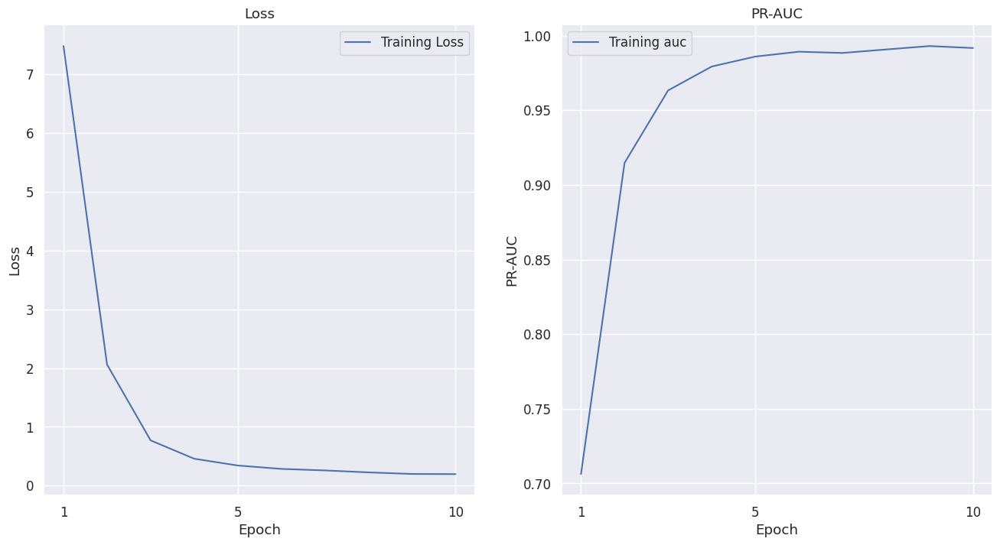

In [ ]:
# Estrai i dati di PrecisionRecall e loss dall'oggetto history
xaxis = range(1,11)
aucF = historyfinal.history['auc']
lossF = historyfinal.history['loss']


# Crea il grafico
plt.figure(figsize=(16, 8))

# Loss
plt.subplot(1, 2, 1)
plt.plot(xaxis, lossF, label='Training Loss')
plt.xlabel('Epoch')
plt.xticks([1,5,10])
plt.ylabel('Loss')
plt.title('Loss')
plt.legend()


# PR-AUC
plt.subplot(1, 2, 2)
plt.plot(xaxis, aucF, label='Training auc')
plt.xlabel('Epoch')
plt.xticks([1,5,10])
plt.ylabel('PR-AUC')
plt.title('PR-AUC')
plt.legend()

# Mostra i grafici
plt.show()



---



# **Model evaluation**

I now evaluate the performance of the model on the test set.

Metrics: Confusion Matrix & Precision-Recall Curve.

In [ ]:
modelfinal.evaluate(X_test_ragged,y_test)

448/448 [==============================] - 17s 34ms/step - loss: 0.4955 - auc: 0.9543


[0.4955388903617859, 0.9542614221572876]

In [ ]:
prediction = modelfinal.predict(X_test_ragged)

448/448 [==============================] - 12s 22ms/step


In [ ]:
# function to convert int for confusion matrix

def conv_num_cat(one_hot_array):

  np_array = np.argmax(one_hot_array, axis=1)

  np_cat = np.where(np_array == 0, 'deep_learning',
                     np.where(np_array == 1, 'virtual_reality',
                     np.where(np_array == 2, 'covid_19',
                     np.where(np_array == 3, 'brain_machine_interfaces',
                     np.where(np_array == 4, 'human_connectome',"NaN")))))

  return np_cat






---



# **Confusion Matrix**

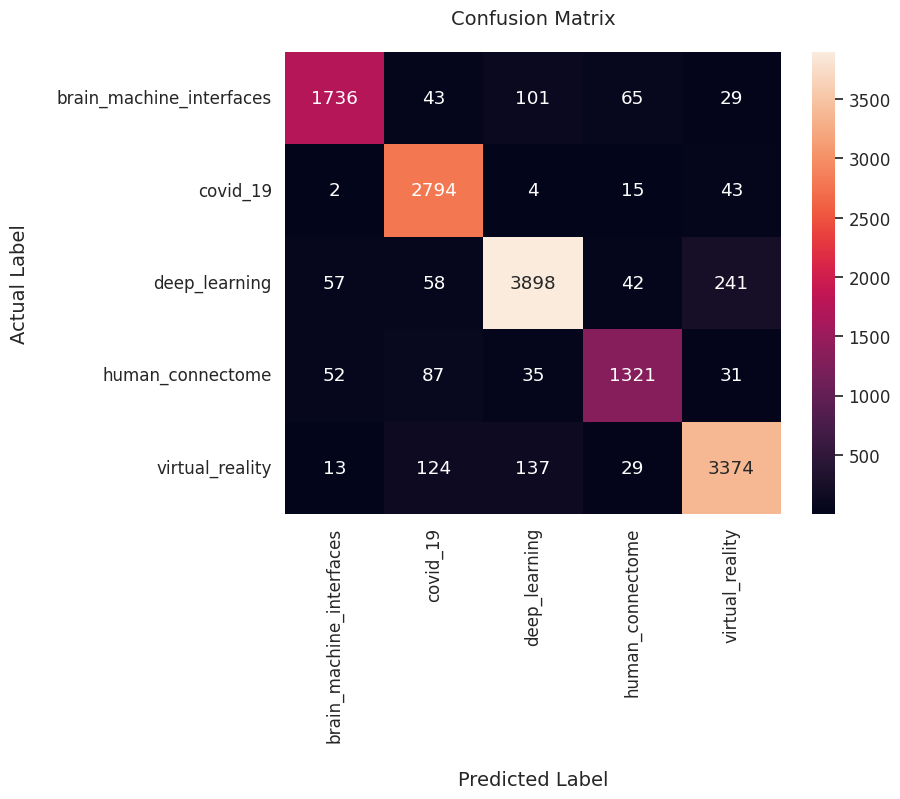

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

predictions_cat = conv_num_cat(prediction)
y_test_cat = conv_num_cat(y_test)


conf_matrix = confusion_matrix(y_test_cat, predictions_cat,labels = ["brain_machine_interfaces","covid_19","deep_learning","human_connectome","virtual_reality"])

plt.figure(figsize=(8,6), dpi=100)
sn.set(font_scale = 1.1)
ax = sn.heatmap(conf_matrix, annot=True, fmt='d', )

ax.set_xlabel("Predicted Label", fontsize=14, labelpad=20)
ax.xaxis.set_ticklabels(["brain_machine_interfaces","covid_19","deep_learning","human_connectome","virtual_reality"])
ax.tick_params(axis='x', rotation=90)

ax.set_ylabel("Actual Label", fontsize=14, labelpad=20)
ax.yaxis.set_ticklabels(["brain_machine_interfaces","covid_19","deep_learning","human_connectome","virtual_reality"])
ax.tick_params(axis='y', rotation=0)


ax.set_title("Confusion Matrix", fontsize=14, pad=20)

plt.show()



In [ ]:
target_names = ["brain_machine_interfaces","covid_19","deep_learning","human_connectome","virtual_reality"]
print(classification_report(y_test_cat, predictions_cat, target_names=target_names))

                          precision    recall  f1-score   support

brain_machine_interfaces       0.93      0.88      0.91      1974
                covid_19       0.90      0.98      0.94      2858
           deep_learning       0.93      0.91      0.92      4296
        human_connectome       0.90      0.87      0.88      1526
         virtual_reality       0.91      0.92      0.91      3677

                accuracy                           0.92     14331
               macro avg       0.91      0.91      0.91     14331
            weighted avg       0.92      0.92      0.92     14331



We obtained a diagonal confusion matrix: the ability of our model to generalize is very high.

Furthermore, looking at the results obtained, it is possible to observe that the precision values obtained are very high (between 90 and 93%) for all classes, including the least numerous.

The accuracy of our model is 92%.



---



# **Precision-Recall Curve**

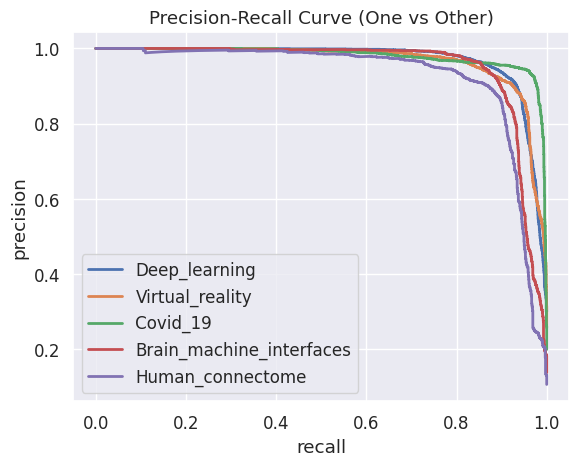

In [ ]:
#Plot Precision-Recall Curve

y_score = prediction
n_classes = 5
lista_label= ['Deep_learning','Virtual_reality', 'Covid_19', 'Brain_machine_interfaces', 'Human_connectome']
precision = dict()
recall = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test[:, i],y_score[:, i])
    plt.plot(recall[i], precision[i], lw=2,  label= (lista_label[i]))

plt.xlabel("recall")
plt.ylabel("precision")
plt.legend(loc="best")
plt.title("Precision-Recall Curve (One vs Other)")
plt.show()



---



# **New Predictions**

At this point, to further test the goodness of our model, we selected three abstracts from different scientific journals, therefore not present in the PubMed dataest, for the following topics:

* Deep learning ([link](https://www.sciencedirect.com/science/article/pii/S1877050918322294) to the article);
* Virtual Reality ([link ](https://www.researchgate.net/publication/320517587_A_Study_of_Virtual_Reality) to the article);
* COVID-19 ([link](https://www.nature.com/articles/s41579-020-00459-7) to the article).

In [ ]:
def prediction_on_sentence(sentence):
  y = pd.Series(' '.join(map(str, pre_processing(sentence))))
  tokenizer.fit_on_texts(y)
  t_ragged=tf.ragged.constant(tokenizer.texts_to_sequences(y))
  predictions = model2.predict(t_ragged)
  for i in range(len(lista_label)):
    print(f"The paper's topic is {lista_label[i]} with a probability of {round((predictions[0,i]*100),3)}%.")

In [ ]:
AbstractDeeplearning = "Deep learning neural networks produce excellent results in various pattern recognition tasks. It is of great practical importance to answer some open questions regarding model design and parameterization, and to understand how input data are converted into meaningful knowledge at the output. The layer-by-layer evolution of the abstraction level has been proposed previously as a quantitative measure to describe the emergence of knowledge in the network. In this work we systematically evaluate the abstraction level for a variety of image datasets. We observe that there is a general tendency of increasing abstraction from input to output with the exception of a drop of abstraction at some ReLu and Pooling layers. The abstraction level is relatively low and does not change significantly in the first few layers following the input, while it fluctuates around some high saturation value at the layers preceding the output. Finally, the layer-by-layer change in abstraction is not normally distributed, rather it approximates an exponential distribution. These results point to salient local features of deep layers impacting overall (global) classification performance. We compare the results extracted from deep learning neural networks performing image processing tasks with the results obtained by analyzing brain imaging data. Our conclusions may be helpful in future designs of more efficient, compact deep learning neural networks."

In [ ]:
prediction_on_sentence(AbstractDeeplearning)

1/1 [==============================] - 2s 2s/step
La probabilita' che l'abstract rientri nel topic Deep_learning e': 99.838%.
La probabilita' che l'abstract rientri nel topic Virtual_reality e': 0.012%.
La probabilita' che l'abstract rientri nel topic Covid_19 e': 0.002%.
La probabilita' che l'abstract rientri nel topic Brain_machine_interfaces e': 0.136%.
La probabilita' che l'abstract rientri nel topic Human_connectome e': 0.011%.


In [ ]:
AbstractVirtualReality = "Virtual reality (VR) is a powerful and interactive technology that changes our life unlike any other. Virtual reality, which can also be termed as immersive multimedia, is the art of simulating a physical presence for the audience in places both real and imaginary. It usually involves two senses namely sight and sound. The key property that distinguished VR from all previous media types is presence. Presence is the psychological sense of being there, of actually being immersed in and surrounded by in the environment. This discussion is an attempt to give an overview of the current state of environment-related VR, with an emphasis on live VR experiences. The technology, art and business of VR are evolving rapidly. The various fields of VR are discussed to get a better view about it. The next development based on virtual reality is augmented reality."

In [ ]:
prediction_on_sentence(AbstractVirtualReality)

1/1 [==============================] - 0s 19ms/step
La probabilita' che l'abstract rientri nel topic Deep_learning e': 0.001%.
La probabilita' che l'abstract rientri nel topic Virtual_reality e': 99.998%.
La probabilita' che l'abstract rientri nel topic Covid_19 e': 0.001%.
La probabilita' che l'abstract rientri nel topic Brain_machine_interfaces e': 0.0%.
La probabilita' che l'abstract rientri nel topic Human_connectome e': 0.0%.


In [ ]:
AbstractCovid19 = "Since its emergence in December 2019, corona virus disease 2019 (COVID-19) has impacted several countries, affecting more than 90 thousand patients and making it a global public threat. The routes of transmission are direct contact, and droplet and possible aerosol transmissions. Due to the unique nature of dentistry, most dental procedures generate significant amounts of droplets and aerosols, posing potential risks of infection transmission. Understanding the significance of aerosol transmission and its implications in dentistry can facilitate the identification and correction of negligence in daily dental practice. In addition to the standard precautions, some special precautions that should be implemented during an outbreak have been raised in this review. Copyright © 2020, Zhejiang University and Springer-Verlag GmbH Germany, part of Springer Nature. Reproduced with permission."

In [ ]:
prediction_on_sentence(AbstractCovid19)

1/1 [==============================] - 0s 24ms/step
La probabilita' che l'abstract rientri nel topic Deep_learning e': 0.203%.
La probabilita' che l'abstract rientri nel topic Virtual_reality e': 0.106%.
La probabilita' che l'abstract rientri nel topic Covid_19 e': 87.226%.
La probabilita' che l'abstract rientri nel topic Brain_machine_interfaces e': 0.325%.
La probabilita' che l'abstract rientri nel topic Human_connectome e': 12.139%.


In conclusion, we can state that our model is able to predict the topic of a scientific article, belonging to one of the 5 categories examined, starting from their abstract, with a probability of success greater than 99% for the first two cases. and about 87% for the last one.